## Exploratory Data Analytics and Machine Learning in Life Expectancy Data

In [1]:
# Imporing necessary libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor

from sklearn import metrics
from sklearn.metrics import mean_squared_error, r2_score

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Reading the dataset

d=pd.read_csv(r"Life Expectancy Data.csv")

In [3]:
# To display the first 5 rows of the dataset

d.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [4]:
# To display the last 5 rows of the dataset

d.tail()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
2933,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.0,68.0,31,...,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.0,7.0,998,...,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5
2935,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.0,73.0,304,...,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.0,76.0,529,...,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8
2937,Zimbabwe,2000,Developing,46.0,665.0,24,1.68,0.0,79.0,1483,...,78.0,7.10,78.0,43.5,547.358878,12222251.0,11.0,11.2,0.434,9.8


In [5]:
# To display the number of rows and columns

d.shape

(2938, 22)

In [6]:
# To get the column names

d.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

In [7]:
# To know about the datatype of each column

d.dtypes

Country                             object
Year                                 int64
Status                              object
Life expectancy                    float64
Adult Mortality                    float64
infant deaths                        int64
Alcohol                            float64
percentage expenditure             float64
Hepatitis B                        float64
Measles                              int64
 BMI                               float64
under-five deaths                    int64
Polio                              float64
Total expenditure                  float64
Diphtheria                         float64
 HIV/AIDS                          float64
GDP                                float64
Population                         float64
 thinness  1-19 years              float64
 thinness 5-9 years                float64
Income composition of resources    float64
Schooling                          float64
dtype: object

In [8]:
# There are datatypes other than numerical. It needs to be replaced.

In [9]:
# To get the individual values in the non-numerical datatype column.

nn=['Country','Status']

for i in nn:
    print('Values in',i,':')
    print(d[i].unique())
    print()

Values in Country :
['Afghanistan' 'Albania' 'Algeria' 'Angola' 'Antigua and Barbuda'
 'Argentina' 'Armenia' 'Australia' 'Austria' 'Azerbaijan' 'Bahamas'
 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus' 'Belgium' 'Belize' 'Benin'
 'Bhutan' 'Bolivia (Plurinational State of)' 'Bosnia and Herzegovina'
 'Botswana' 'Brazil' 'Brunei Darussalam' 'Bulgaria' 'Burkina Faso'
 'Burundi' "Côte d'Ivoire" 'Cabo Verde' 'Cambodia' 'Cameroon' 'Canada'
 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia' 'Comoros'
 'Congo' 'Cook Islands' 'Costa Rica' 'Croatia' 'Cuba' 'Cyprus' 'Czechia'
 "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 'Dominica'
 'Dominican Republic' 'Ecuador' 'Egypt' 'El Salvador' 'Equatorial Guinea'
 'Eritrea' 'Estonia' 'Ethiopia' 'Fiji' 'Finland' 'France' 'Gabon' 'Gambia'
 'Georgia' 'Germany' 'Ghana' 'Greece' 'Grenada' 'Guatemala' 'Guinea'
 'Guinea-Bissau' 'Guyana' 'Haiti' 'Honduras' 'Hungary' 'Iceland' 'India'
 'Indonesia' 'Iran (I

In [10]:
# Replacing the non-numerical datatype values with numerical values using LabelEncoder.

le=LabelEncoder()
d['Country']=le.fit_transform(d['Country'])
d['Status']=le.fit_transform(d['Status'])

In [11]:
# Checking data

d

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,0,2015,1,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,0,2014,1,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,0,2013,1,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,0,2012,1,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,0,2011,1,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,192,2004,1,44.3,723.0,27,4.36,0.000000,68.0,31,...,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,192,2003,1,44.5,715.0,26,4.06,0.000000,7.0,998,...,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5
2935,192,2002,1,44.8,73.0,25,4.43,0.000000,73.0,304,...,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,192,2001,1,45.3,686.0,25,1.72,0.000000,76.0,529,...,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8


In [12]:
# To display basic information

d.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   int32  
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   int32  
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [13]:
# To display statistical insights of data

d.describe()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
count,2938.000000,2938.000000,2938.000000,2928.000000,2928.000000,2938.000000,2744.000000,2938.000000,2385.000000,2938.000000,...,2919.000000,2712.00000,2919.000000,2938.000000,2490.000000,2.286000e+03,2904.000000,2904.000000,2771.000000,2775.000000
mean,95.096324,2007.518720,0.825732,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,...,82.550188,5.93819,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,56.244904,4.613841,0.379405,9.523867,124.292079,117.926501,4.052413,1987.914858,25.070016,11467.272489,...,23.428046,2.49832,23.716912,5.077785,14270.169342,6.101210e+07,4.420195,4.508882,0.210904,3.358920
min,0.000000,2000.000000,0.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,...,3.000000,0.37000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,46.000000,2004.000000,1.000000,63.100000,74.000000,0.000000,0.877500,4.685343,77.000000,0.000000,...,78.000000,4.26000,78.000000,0.100000,463.935626,1.957932e+05,1.600000,1.500000,0.493000,10.100000
50%,93.000000,2008.000000,1.000000,72.100000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,...,93.000000,5.75500,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,3.300000,0.677000,12.300000
75%,145.000000,2012.000000,1.000000,75.700000,228.000000,22.000000,7.702500,441.534144,97.000000,360.250000,...,97.000000,7.49250,97.000000,0.800000,5910.806335,7.420359e+06,7.200000,7.200000,0.779000,14.300000
max,192.000000,2015.000000,1.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,...,99.000000,17.60000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


In [14]:
# Check for null values

d.isnull().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
 BMI                                34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
 HIV/AIDS                            0
GDP                                448
Population                         652
 thinness  1-19 years               34
 thinness 5-9 years                 34
Income composition of resources    167
Schooling                          163
dtype: int64

In [15]:
# Many columns contains missing values.
# Missing values needs to be replaced.
# Missing values can be replaced with mean or median.
# Also check for duplicated rows in the data.

d.duplicated().sum()

0

In [16]:
# To determine whether to replace missing values with the mean or median, 
# you can examine the data's distribution by plotting histogram and checking skewness.
# If the data is skewed, it can be replaced with median.

In [17]:
col=['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling']

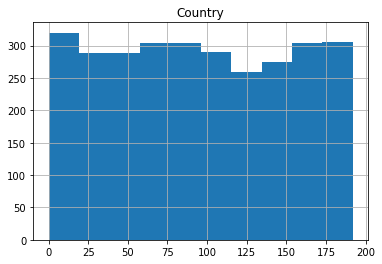

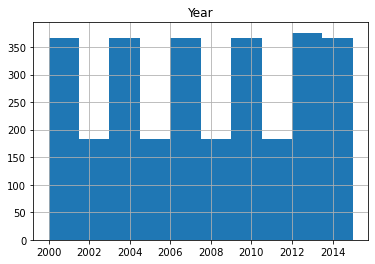

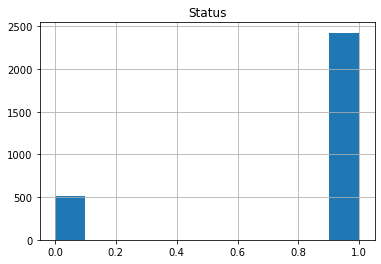

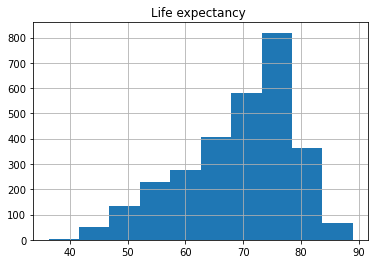

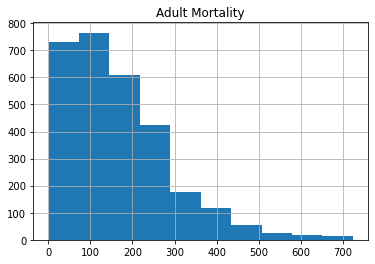

...

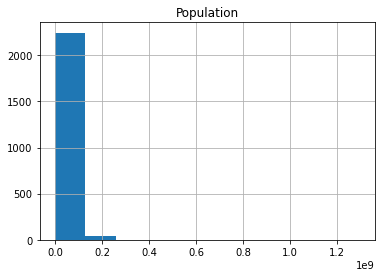

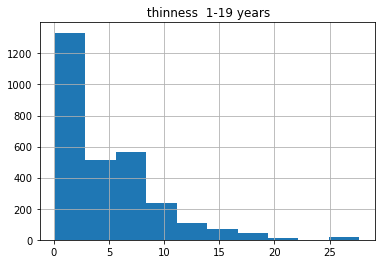

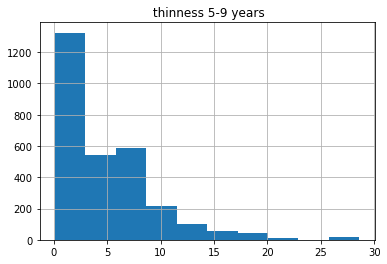

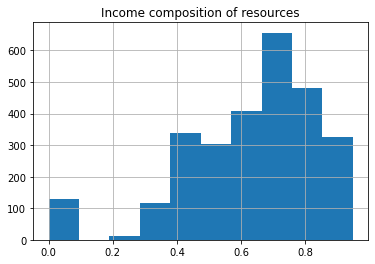

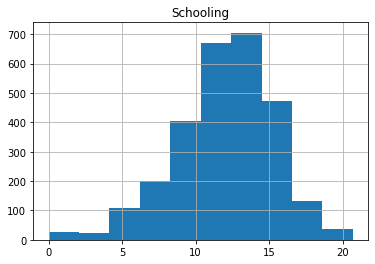

In [18]:
# Plotting histogram

for i in col:
    d.hist(i)

In [19]:
# To check shew

d.skew()

Country                             0.032663
Year                               -0.006409
Status                             -1.718238
Life expectancy                    -0.638605
Adult Mortality                     1.174369
infant deaths                       9.786963
Alcohol                             0.589563
percentage expenditure              4.652051
Hepatitis B                        -1.930845
Measles                             9.441332
 BMI                               -0.219312
under-five deaths                   9.495065
Polio                              -2.098053
Total expenditure                   0.618686
Diphtheria                         -2.072753
 HIV/AIDS                           5.396112
GDP                                 3.206655
Population                         15.916236
 thinness  1-19 years               1.711471
 thinness 5-9 years                 1.777424
Income composition of resources    -1.143763
Schooling                          -0.602437
dtype: flo

In [20]:
# Replacing Life expectancy, BMI, Total expenditure and Schooling with mean and other missing values with median 
# due to the absence and presence of skewness.

col1=['Life expectancy ', ' BMI ', 'Total expenditure', 'Schooling']

for i in col1:
    d[i]=d[i].fillna(d[i].mean())
    
col2=['Adult Mortality',
         'Alcohol', 'Hepatitis B',
         'Polio', 'Diphtheria ', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources']

for j in col2:
    d[j]=d[j].fillna(d[j].median())

In [21]:
# Ckecking for mising values again.

d.isnull().sum()

Country                            0
Year                               0
Status                             0
Life expectancy                    0
Adult Mortality                    0
infant deaths                      0
Alcohol                            0
percentage expenditure             0
Hepatitis B                        0
Measles                            0
 BMI                               0
under-five deaths                  0
Polio                              0
Total expenditure                  0
Diphtheria                         0
 HIV/AIDS                          0
GDP                                0
Population                         0
 thinness  1-19 years              0
 thinness 5-9 years                0
Income composition of resources    0
Schooling                          0
dtype: int64

Country


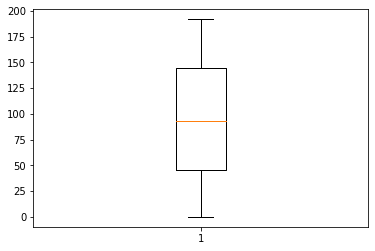

Year


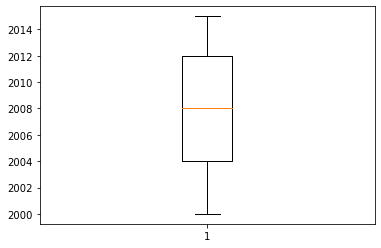

Status


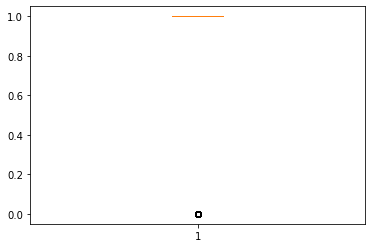

Life expectancy 


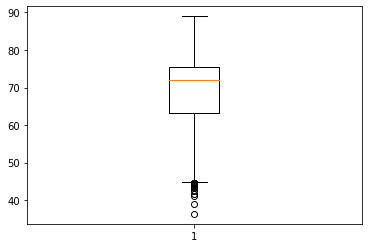

Adult Mortality


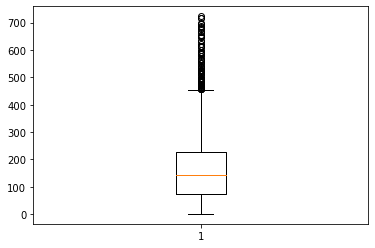

infant deaths


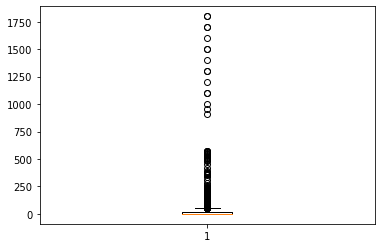

Alcohol


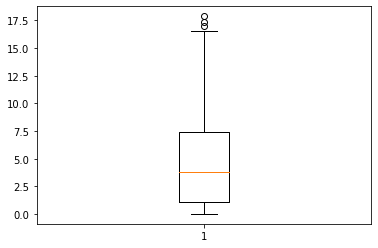

percentage expenditure


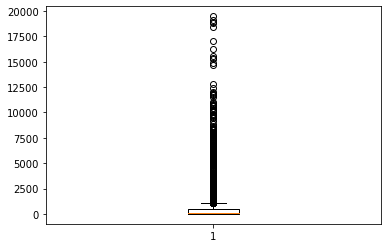

Hepatitis B


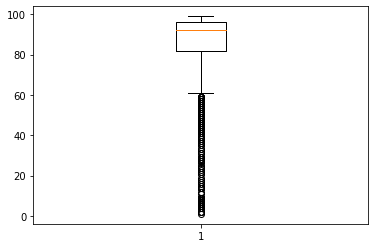

Measles 


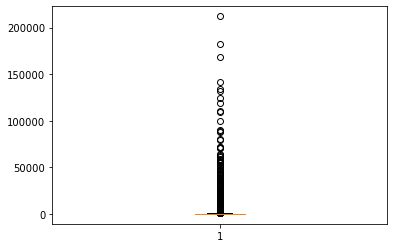

 BMI 


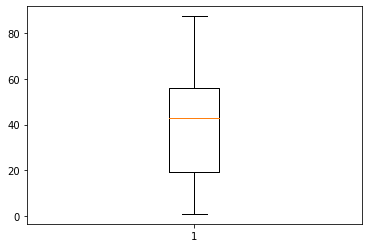

under-five deaths 


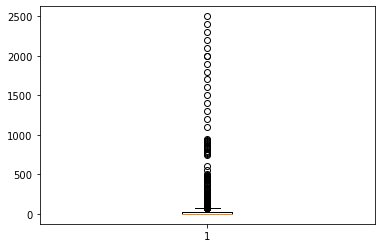

Polio


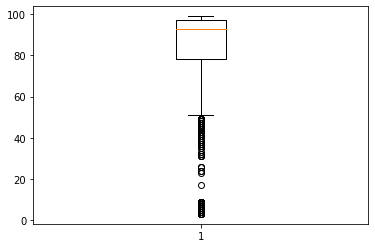

Total expenditure


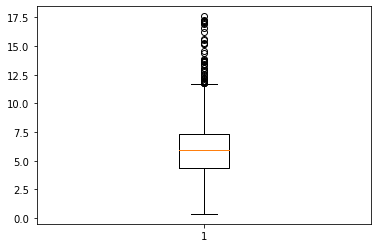

Diphtheria 


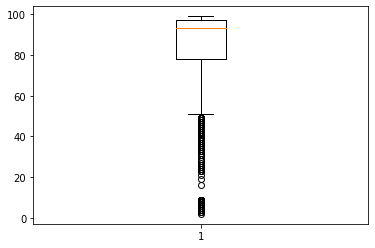

 HIV/AIDS


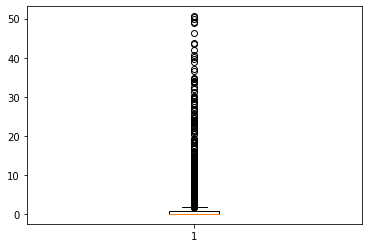

GDP


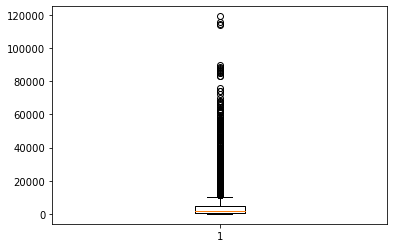

Population


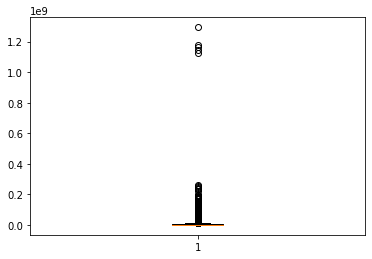

 thinness  1-19 years


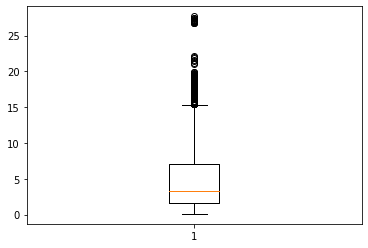

 thinness 5-9 years


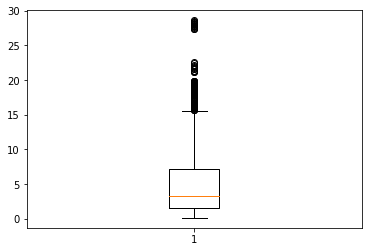

Income composition of resources


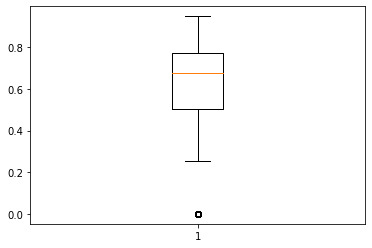

Schooling


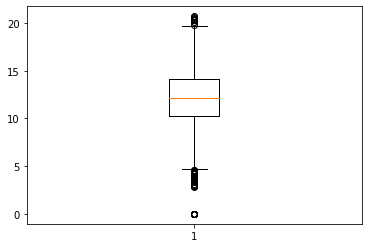

In [22]:
# Finding outliers using boxplot

for i in col:
    print(i)
    plt.boxplot(d[i])
    plt.show()

In [23]:
# Removing outliers

colm=['Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling']

for column_name in colm:
    Q1=np.percentile(d[column_name],25,interpolation="midpoint")
    Q2=np.percentile(d[column_name],50,interpolation="midpoint")
    Q3=np.percentile(d[column_name],75,interpolation="midpoint")
    IQR=Q3-Q1
    low_lim=Q1-1.5*IQR
    up_lim=Q3+1.5*IQR

    index1 = (d[column_name]>up_lim)
    index1 = d.loc[index1].index
    d.loc[list(index1),column_name]=up_lim

    index2 = (d[column_name]<low_lim)
    index2 = d.loc[index2].index
    d.loc[list(index2),column_name]=low_lim

In [24]:
# Checking for missing values

d.isnull().sum()

Country                            0
Year                               0
Status                             0
Life expectancy                    0
Adult Mortality                    0
infant deaths                      0
Alcohol                            0
percentage expenditure             0
Hepatitis B                        0
Measles                            0
 BMI                               0
under-five deaths                  0
Polio                              0
Total expenditure                  0
Diphtheria                         0
 HIV/AIDS                          0
GDP                                0
Population                         0
 thinness  1-19 years              0
 thinness 5-9 years                0
Income composition of resources    0
Schooling                          0
dtype: int64

Country


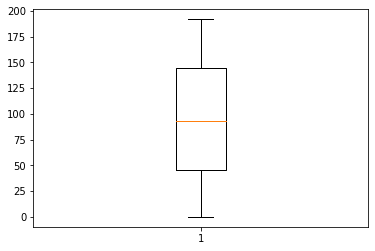

Year


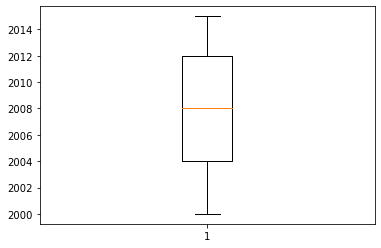

Status


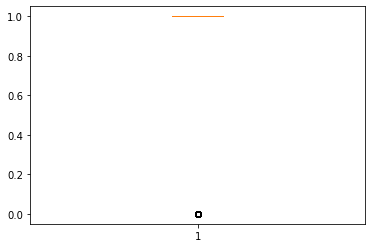

Life expectancy 


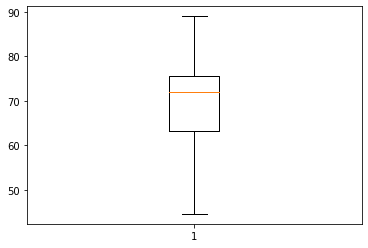

Adult Mortality


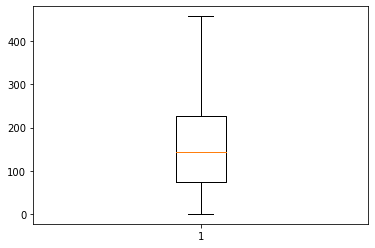

infant deaths


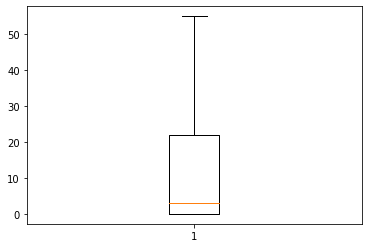

Alcohol


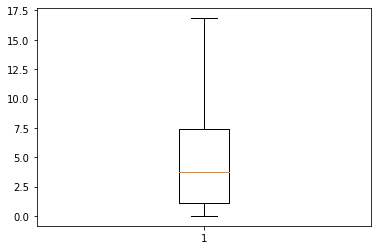

percentage expenditure


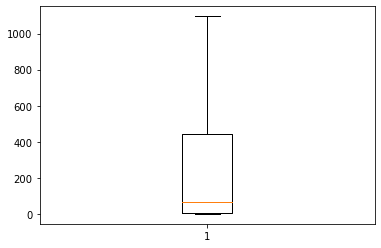

Hepatitis B


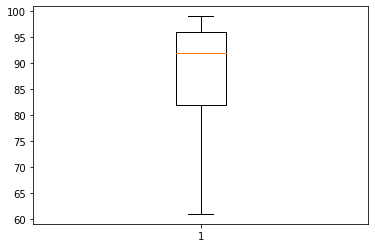

Measles 


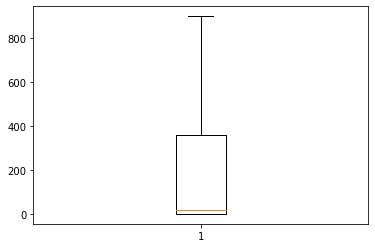

 BMI 


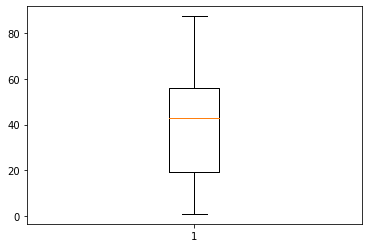

under-five deaths 


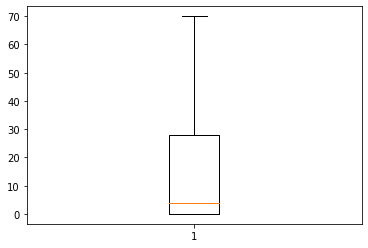

Polio


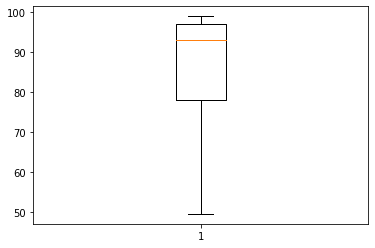

Total expenditure


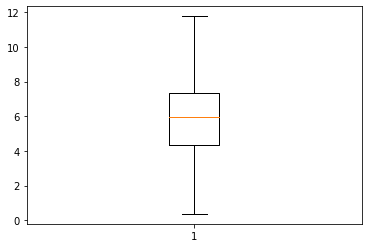

Diphtheria 


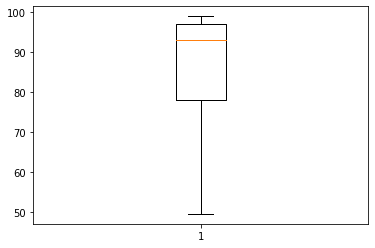

 HIV/AIDS


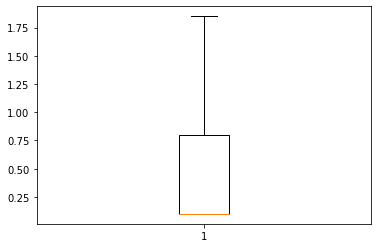

GDP


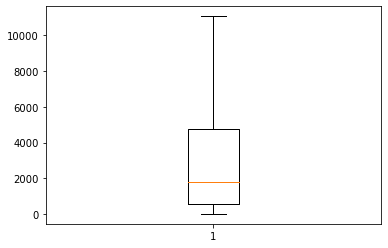

Population


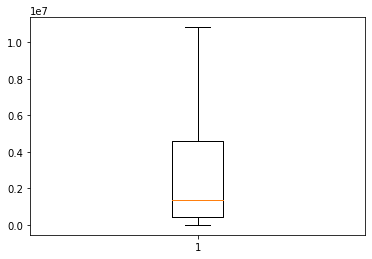

 thinness  1-19 years


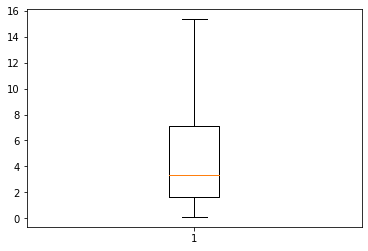

 thinness 5-9 years


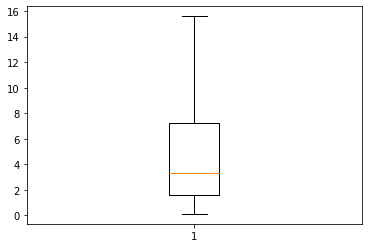

Income composition of resources


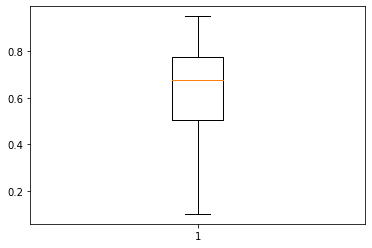

Schooling


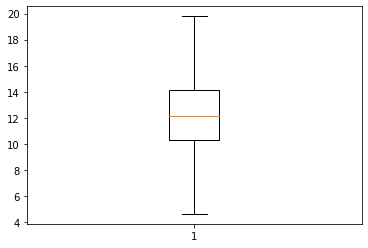

In [25]:
# Checking for outliers using boxplot

for i in col:
    print(i)
    plt.boxplot(d[i])
    plt.show()

In [26]:
# Scaling the data
# Categorical columns should not be scaled.

dt=d.copy()
dc=dt.drop(['Life expectancy ','Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],axis=1)


sc=StandardScaler()
scdata=pd.DataFrame(sc.fit_transform(d.drop(['Country', 'Year', 'Status'],axis=1)),columns=['Life expectancy ','Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'])


d = pd.concat([dc,scdata], axis=1)

In [27]:
d

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,0,2015,1,-0.446803,0.875099,2.165057,-1.157387,-0.546448,-1.788340,1.885380,...,-2.268402,0.985324,-1.285904,-0.629209,-0.756964,1.995819,2.711459,2.740246,-0.813296,-0.626982
1,0,2014,1,-0.984892,0.944382,2.165057,-1.157387,-0.540682,-2.032107,0.732787,...,-1.730664,0.994061,-1.475921,-0.629209,-0.749432,-0.741786,2.711459,2.740246,-0.828943,-0.659237
2,0,2013,1,-0.984892,0.918400,2.165057,-1.157387,-0.541464,-1.869596,0.557099,...,-1.477611,0.972218,-1.349243,-0.629209,-0.744387,1.995819,2.711459,2.740246,-0.860238,-0.691493
3,0,2012,1,-1.027095,0.953042,2.165057,-1.157387,-0.528706,-1.625829,1.885380,...,-1.161295,1.142595,-1.159226,-0.629209,-0.734265,0.136827,2.711459,2.740246,-0.896748,-0.723749
4,0,2011,1,-1.058747,0.979023,2.165057,-1.157387,-0.711369,-1.544574,1.885380,...,-1.098031,0.858634,-1.095887,-0.629209,-0.894890,-0.050495,2.711459,2.740246,-0.943690,-0.820516
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,192,2004,1,-2.599157,2.550876,0.699524,-0.047534,-0.729606,-1.544574,-0.573533,...,-1.161295,0.535355,-1.285904,1.895041,-0.791370,1.995819,1.198386,1.180722,-1.188831,-0.917284
2934,192,2003,1,-2.599157,2.550876,0.647183,-0.124076,-0.729606,-2.113362,1.885380,...,-2.268402,0.268868,-1.095887,1.895041,-0.791638,1.995819,1.300105,1.306490,-1.131458,-0.820516
2935,192,2002,1,-2.578055,-0.770367,0.594843,-0.029674,-0.729606,-1.138296,0.200058,...,-0.781715,0.273237,-0.905869,1.895041,-0.896529,-0.794475,-0.886858,-0.856721,-1.084516,-0.659237
2936,192,2001,1,-2.525301,2.550876,0.594843,-0.721100,-0.729606,-0.894530,0.837632,...,-0.591925,0.111598,-0.652513,1.895041,-0.766413,1.995819,-0.785139,-0.756107,-1.084516,-0.723749


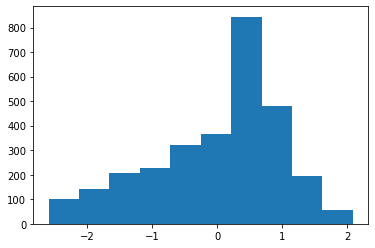

In [28]:
# The distribution of life expectancy 

plt.hist(d['Life expectancy '])
plt.show()

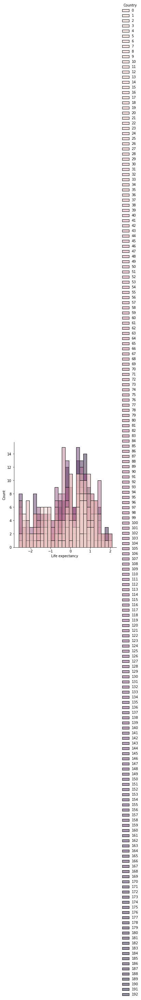

In [29]:
sns.displot(d,x="Life expectancy ", hue="Country",kind='hist')
plt.show()

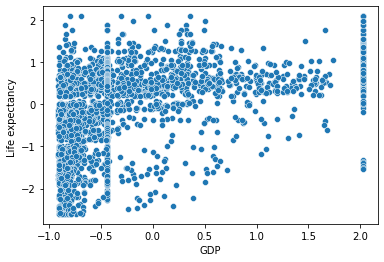

In [30]:
# Plotting scatterplot for GDP and Life expectancy

sns.scatterplot(d['GDP'],d["Life expectancy "])
plt.show()

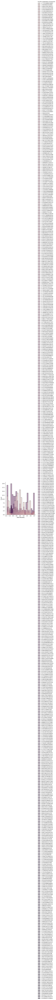

In [31]:
# Plotting relationship between adult mortality for different income groups

sns.displot(d,x='Adult Mortality', hue='Income composition of resources',kind='hist')
plt.show()

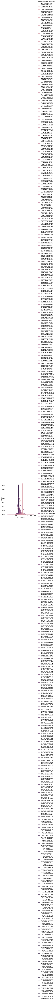

In [32]:
sns.displot(d,x='Adult Mortality', hue='Income composition of resources',kind='kde')
plt.show()

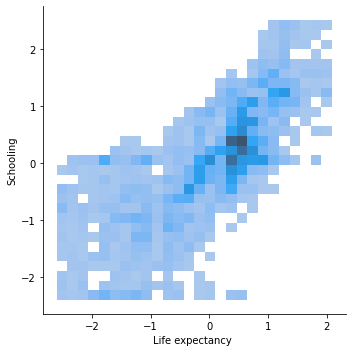

In [33]:
# Plotting relationship between impact of education on life expectancy

sns.displot(d,x="Life expectancy ", y='Schooling',kind='hist')
plt.show()

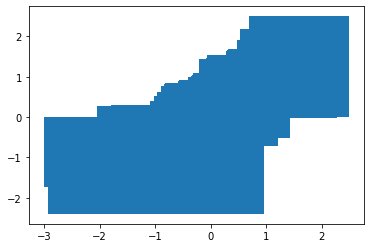

In [34]:
plt.bar(d["Life expectancy "], d['Schooling'])
plt.show()

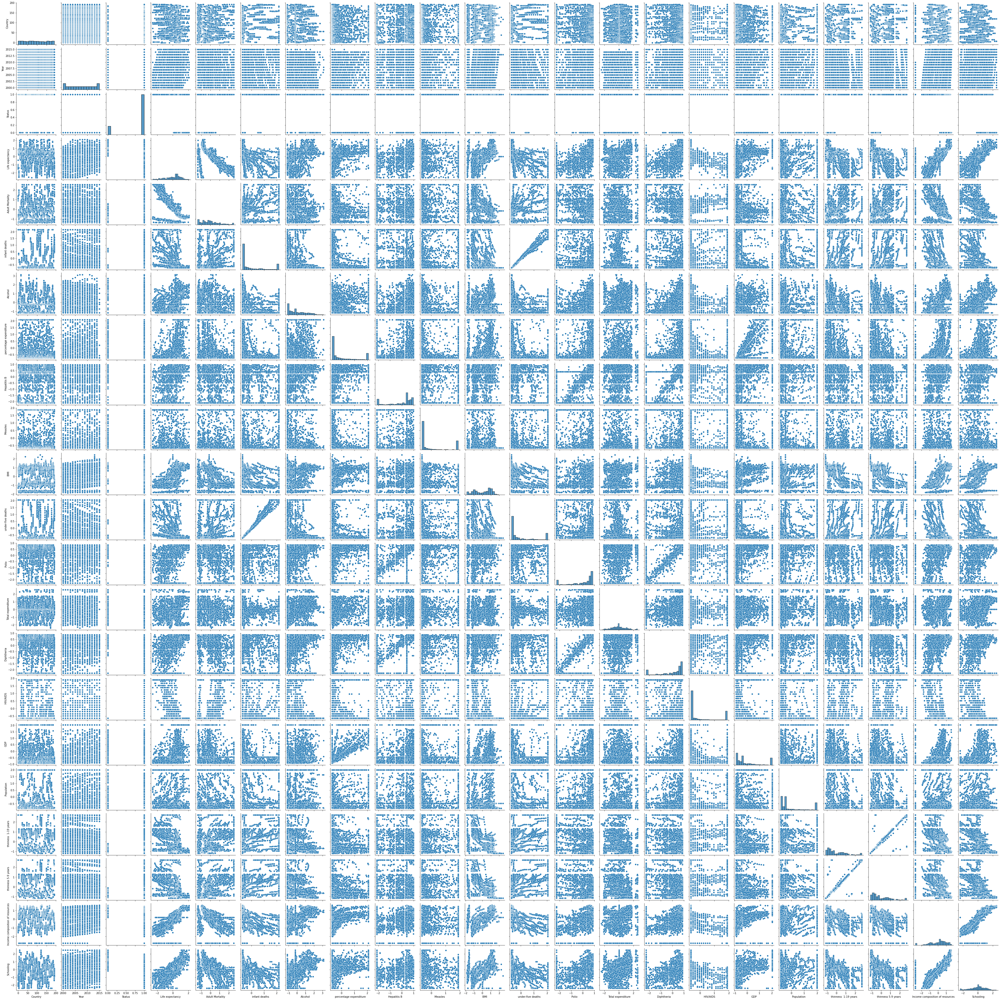

In [35]:
# Creating pairplot

sns.pairplot(d)
plt.show()

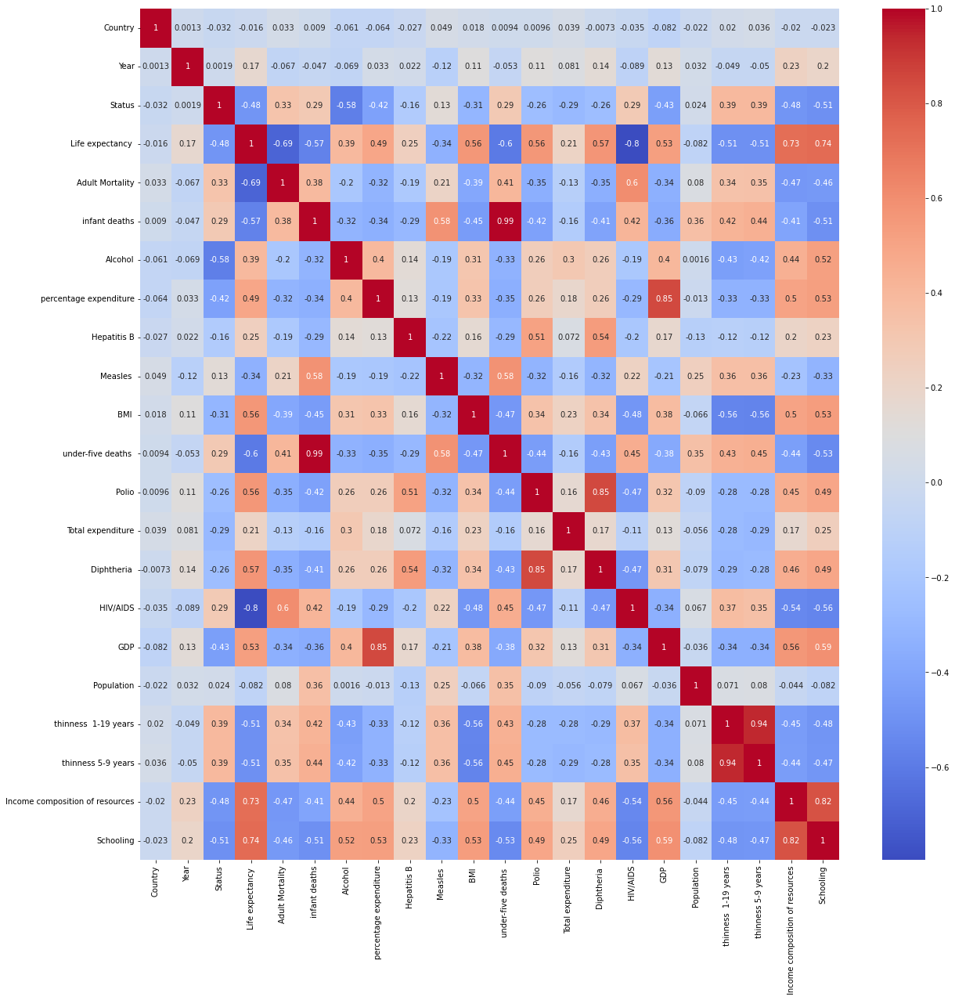

In [36]:
# Creating correlation heatmap

plt.figure(figsize=(20,20))
sns.heatmap(d.corr(),annot=True,cmap='coolwarm')
plt.show()

In [37]:
# The given boxplots shows possible correlation between some columns.

# correlation shows the relationship between 2 columns.
# The correlation coefficient is a measure of the strength of the linear relationship between two variables. 
# A correlation coefficient of 1 indicates a perfect positive correlation, 
# while a correlation coefficient of -1 indicates a perfect negative correlation. 
# A correlation coefficient of 0 indicates no correlation.

# GDP and percentage expenditure are positively corelated with a value of 0.85.
# So, one them can be removed while doing machine learning. So, percentage expenditure can be removed.

# Under five deaths and infant deaths are also highly positively correlated with value 0.99.
# So, infant death can be removed.

d=d.drop(['percentage expenditure','infant deaths'],axis=1)

In [38]:
# Machine learning

# Splitting the data into x and y. ie, independant variables and target column.

y=d["Life expectancy "]
x=d.drop(["Life expectancy "],axis=1)

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=7)

In [46]:
# Traing the model with RandomForestRegressor

rfr=RandomForestRegressor(n_estimators=100, max_depth=10)

rfr.fit(x_train,y_train)
rfr_train=rfr.predict(x_train)
rfr_test=rfr.predict(x_test)

print('MSE :',mean_squared_error(y_test, rfr_test))
print('r2_score of train :',r2_score(y_train,rfr_train))
print('r2_score of test :',r2_score(y_test, rfr_test))

MSE : 0.05060551955657728
r2_score of train : 0.9902181015904878
r2_score of test : 0.9510906497200886


In [47]:
# Model traning score

rfr.score(x_train, y_train)

0.9902181015904878

In [48]:
# Model testing score

rfr.score(x_test, y_test)

0.9510906497200886

The MSE (mean squared error) of 0.05060551955657728 indicates that the model has a very low error rate. MSE is a measure of the average squared error between the predicted values and the actual values. A lower MSE indicates a better fit.

The R-squared scores of 0.9902181015904878 for the training set and 0.9510906497200886 for the test set indicate that the model is not overfitting the training data. Overfitting occurs when a model learns the training data too well and is unable to generalize to new data.

In this case, the model is able to predict the target variable with a high degree of accuracy on both the training data and the test data. This suggests that the model is not picking up on noise in the training data that is not relevant to the target variable.

In [49]:
# Training the model by changing the max_depth

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=7)

rfr=RandomForestRegressor(n_estimators=100, max_depth=6)

rfr.fit(x_train,y_train)
rfr_train=rfr.predict(x_train)
rfr_test=rfr.predict(x_test)

print('MSE :',mean_squared_error(y_test, rfr_test))
print('r2_score of train :',r2_score(y_train,rfr_train))
print('r2_score of test :',r2_score(y_test, rfr_test))

MSE : 0.06958000674430052
r2_score of train : 0.9594476436165891
r2_score of test : 0.9327521394473406


The MSE (mean squared error) of 0.06958000674430052 indicates that the model has a very low error rate. MSE is a measure of the average squared error between the predicted values and the actual values. A lower MSE indicates a better fit.

The R-squared scores of 0.9594476436165891 for the training set and 0.9327521394473406 for the test set indicate that the model is not overfitting the training data. Overfitting occurs when a model learns the training data too well and is unable to generalize to new data.

In this case, the model is able to predict the target variable with a high degree of accuracy on both the training data and the test data. This suggests that the model is not picking up on noise in the training data that is not relevant to the target variable.

In [50]:
# Training the model with DecisionTreeRegressor

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=7)

dtr=DecisionTreeRegressor()

dtr.fit(x_train,y_train)
dtr_train=dtr.predict(x_train)
dtr_test=dtr.predict(x_test)

print('MSE :',mean_squared_error(y_test, dtr_test))
print('r2_score of train :',r2_score(y_train,dtr_train))
print('r2_score of test :',r2_score(y_test, dtr_test))

MSE : 0.096038327077026
r2_score of train : 1.0
r2_score of test : 0.9071806352258572


The MSE (mean squared error) of 0.096038327077026 indicates that the model has a low error rate. MSE is a measure of the average squared error between the predicted values and the actual values. A lower MSE indicates a better fit.

The R-squared scores of 1.0 for the training set and 0.9071806352258572 for the test set indicate that the model is overfitting the training data. Overfitting occurs when a model learns the training data too well and is unable to generalize to new data.

In this case, the model is able to predict the target variable with a high degree of accuracy on the training data, but it is not able to do as well on the test data. This suggests that the model is picking up on noise in the training data that is not relevant to the target variable.

In [51]:
# Training the model with DecisionTreeRegressor by changing the max_depth

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=7)

dtr=DecisionTreeRegressor(max_depth=5)

dtr.fit(x_train,y_train)
dtr_train=dtr.predict(x_train)
dtr_test=dtr.predict(x_test)

print('MSE :',mean_squared_error(y_test, dtr_test))
print('r2_score of train :',r2_score(y_train,dtr_train))
print('r2_score of test :',r2_score(y_test, dtr_test))

MSE : 0.10383534864623367
r2_score of train : 0.9145288690195443
r2_score of test : 0.8996449501383431


The MSE (mean squared error) of 0.10383534864623367 indicates that the model has a relatively low error rate. MSE is a measure of the average squared error between the predicted values and the actual values. A lower MSE indicates a better fit.

The R-squared scores of 0.9145288690195443 for the training set and 0.8996449501383431 for the test set indicate that the model is not overfitting the training data. Overfitting occurs when a model learns the training data too well and is unable to generalize to new data.

In this case, the model is able to predict the target variable with a high degree of accuracy on both the training data and the test data. This suggests that the model is not picking up on noise in the training data that is not relevant to the target variable.

In [52]:
# Training the model with KNeighborsRegressor

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=7)

knr=KNeighborsRegressor()

knr.fit(x_train,y_train)
knr_train=knr.predict(x_train)
knr_test=knr.predict(x_test)

print('MSE :',mean_squared_error(y_test, knr_test))
print('r2_score of train :',r2_score(y_train,knr_train))
print('r2_score of test :',r2_score(y_test, knr_test))

MSE : 0.11300685018301244
r2_score of train : 0.9433229264753161
r2_score of test : 0.8907808541822972


The MSE (mean squared error) of 0.11300685018301244 indicates that the model has a relatively low error rate. MSE is a measure of the average squared error between the predicted values and the actual values. A lower MSE indicates a better fit.

The R-squared scores of 0.9433229264753161 for the training set and 0.8907808541822972 for the test set indicate that the model is not overfitting the training data. Overfitting occurs when a model learns the training data too well and is unable to generalize to new data.

In this case, the model is able to predict the target variable with a high degree of accuracy on both the training data and the test data. This suggests that the model is not picking up on noise in the training data that is not relevant to the target variable.